# Task1 : Movie Genre Classification
    We are tasked to design an Movie Genre classifier based on previous movie data in this jupyter notebook we are going to 
    create a machine learning model that can predict the genre of a movie based on its plot summary or other textual 
    information. we are going to use techniques like TF-IDF or word embeddings with classifiers such as Naive Bayes, 
    Logistic Regression, or Support Vector Machines.

# Methodology:

###  1. Data Collection
###  2. Data Cleaning and Preprocessing
###  3. Data Visualization 
###  4. Feature Engineering
###  5. Model Selection
###  6. Model Training and Evaluation

# Import necessary libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud


In [2]:
import nltk
import os

# Set the custom download path for NLTK data
custom_download_path = '/kaggle/working/nltk_data'

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)

# Download NLTK resources to the custom path
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')




[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

# 1. Data Collection
    For the purpose of designing a Movie Genre classifier, we collected the dataset from Kaggle. The dataset consists of movie-related information sourced from the Internet Movie Database (IMDb). IMDb is a widely recognized online database that provides comprehensive details about movies, TV shows, cast and crew, ratings, reviews, and more.

    The dataset contains a diverse range of textual information, including plot summaries and other relevant details about various movies. This textual data will serve as the basis for training our machine learning model to predict the genre of a movie.

In [4]:
# Read the txt files using pandas 

train_data = pd.read_csv("/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')

test_data_solution  = pd.read_csv("/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [5]:
## View train data 
print("shape",train_data.shape)
train_data.head()


shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [6]:
## View the test solution data 
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [7]:
## We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [8]:
## Check the size 
df.shape

(108414, 4)

# 2. Data Cleaning and Preprocessing
    We will clean and preprocess the data 
    - Removing duplicates
    - Removing Nan rows and column
    - Preprocessing the Data
    

In [9]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates

df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [10]:
## Check for nan values

df.isna().sum()  # Will check for any duplicates

df.dropna( inplace = True ) ## Will drop any nan containing row if exists 

In [11]:
## Check the size 
df.shape

(108414, 4)

In [12]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()
    
    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)
    
    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)
    
    # tokenize and convert to list
    tokens = word_tokenize(text)
    
    ## Lemmatize it 
    lemmatizer  = WordNetLemmatizer()
    
    ## lemmatize each token
   # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()
    
    text = [word for word in text if word not in stopword]
    
    
    return " ".join(text) 
   


In [13]:
## Create list of words in discription column
df["Despcription_clean"] =  df["Description"].apply(preprocessing)

In [14]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 3. Data Visualization
    Will try to analyse the data using Histogram and Bar Chart.
    And will show word cloud for each genre.
    

In [15]:
## Shows us the label counts
df["Genre"].value_counts()

Genre
 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: count, dtype: int64

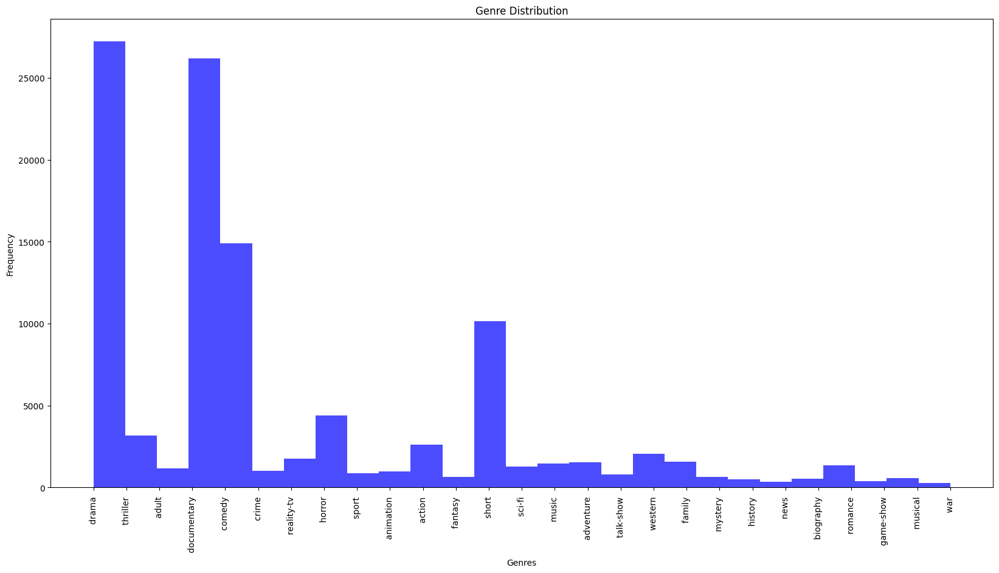

In [16]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

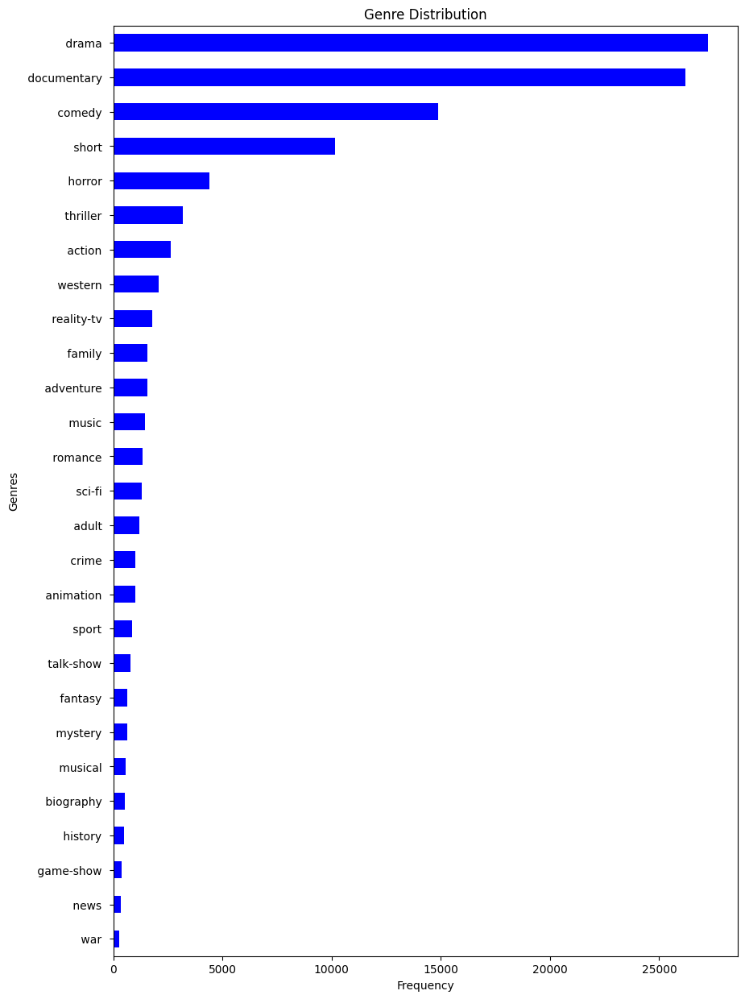

In [17]:
## View genre distribution on Horizontal graph

genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

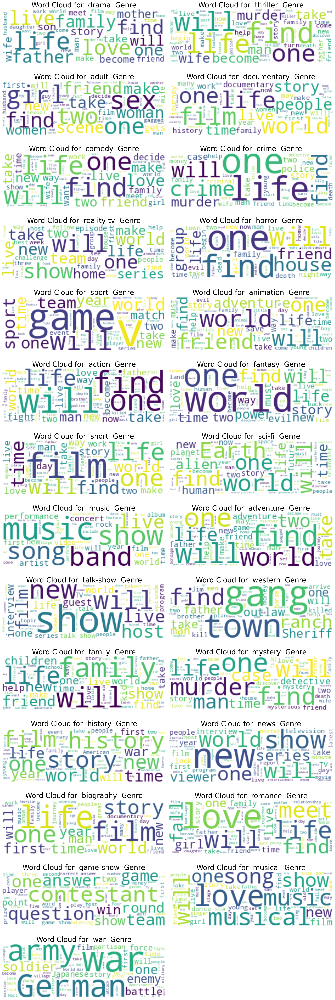

In [18]:
## Below code will generate wordcloud of each genre

# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')

    
plt.tight_layout()
plt.show()


# 4. Feature Engineering
      In this step we will remove unnecessary column which are not necessary for our model

In [19]:
## remove id column from head 
data = df.drop(["Title","id"] , axis = 1) # will drop column 
data.head()


,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 5. Model Selection & Training
  - In this section we will try to apply CountVectorizer and TF-IDF technique and try to predict accuracy on model.

### Importing necessary libraries for model selection and training

In [20]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier 

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay


### Converting Genre into Numerical form

In [21]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names   

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [22]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


### Split the data to test and train

In [23]:
## Split the data
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

## Model training using CountVectorizer technique

In [24]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

### MultinomialNB

Model Score on Training data 0.6417805818436734
Model Score on Training data 0.522829154906193
               precision    recall  f1-score   support

      action        0.03      0.64      0.06        64
       adult        0.02      0.75      0.04        16
   adventure        0.06      0.49      0.10        92
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.44      0.53      0.48      6158
       crime        0.00      0.00      0.00         0
 documentary        0.89      0.57      0.70     20650
       drama        0.84      0.46      0.59     24741
      family        0.00      1.00      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.15      0.97      0.25        30
     history        0.00      0.00      0.00         0
      horror        0.26      0.76      0.39       760
       music        0.04      0.81      0.08        37
     musical        0.00

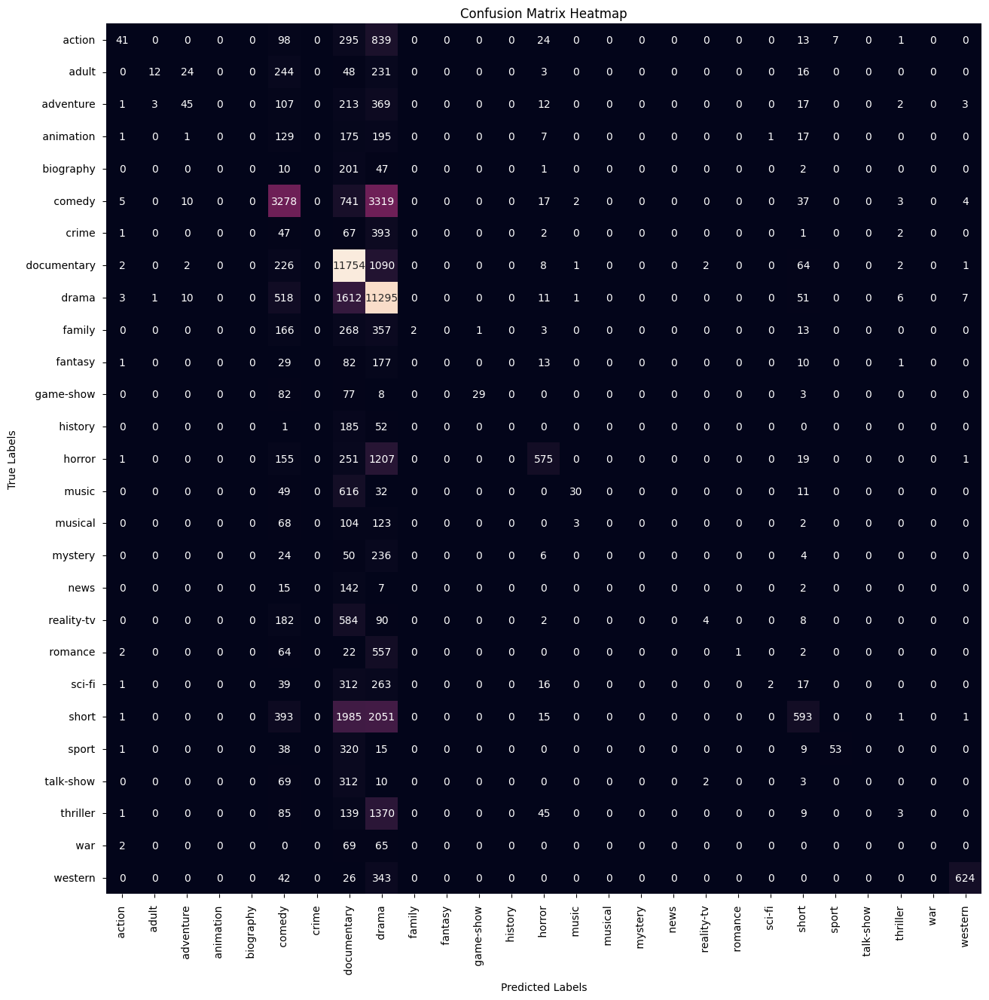

In [25]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))
 
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()    
    

### LogisticRegression

Model Score on Training data 0.9965687088383419
Model Score on Training data 0.5681000608777464
               precision    recall  f1-score   support

      action        0.31      0.41      0.36      1008
       adult        0.40      0.62      0.49       376
   adventure        0.23      0.42      0.30       423
   animation        0.15      0.47      0.23       169
   biography        0.01      0.10      0.02        29
      comedy        0.58      0.53      0.55      8131
       crime        0.09      0.20      0.13       232
 documentary        0.78      0.71      0.74     14467
       drama        0.69      0.56      0.62     16617
      family        0.15      0.34      0.21       364
     fantasy        0.07      0.21      0.10       102
   game-show        0.58      0.76      0.66       152
     history        0.03      0.18      0.04        33
      horror        0.60      0.62      0.61      2143
       music        0.54      0.63      0.58       633
     musical        0.1

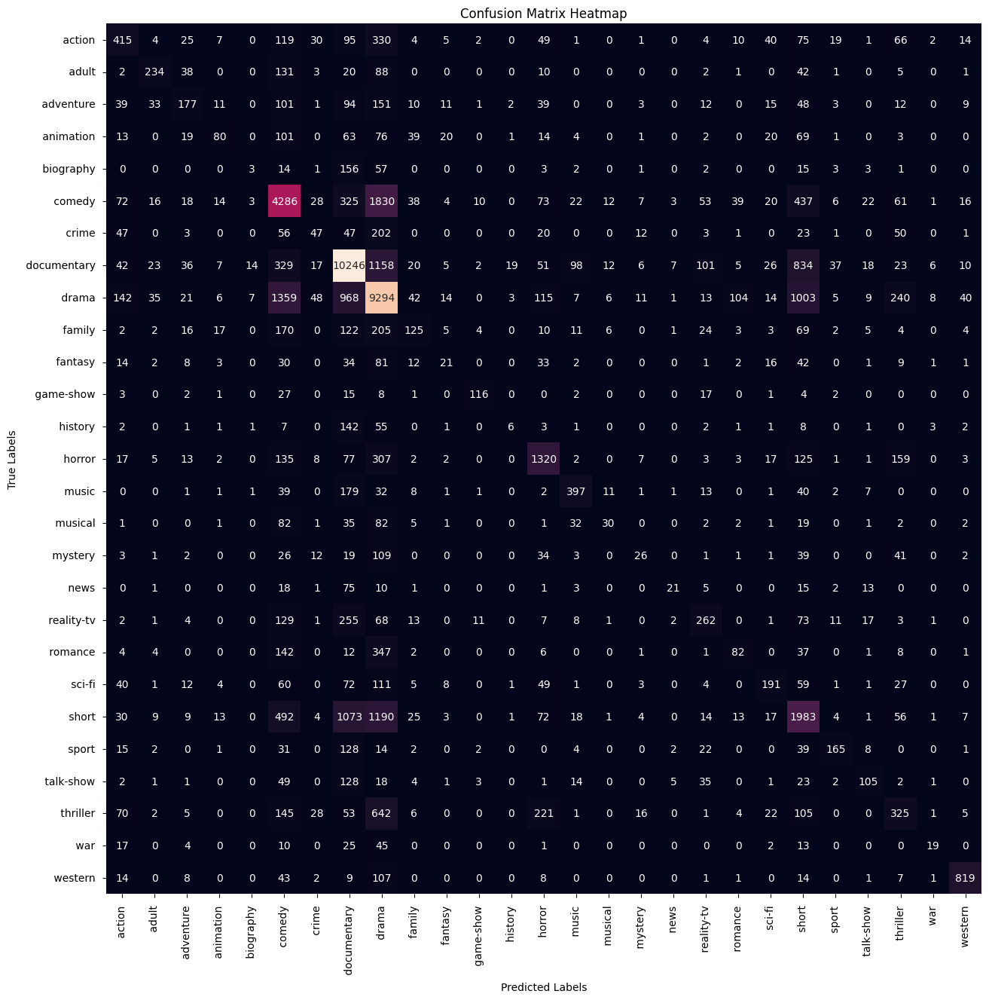

In [26]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC )

Model Score on Training data 0.9995941483572233
Model Score on Training data 0.5200066412087
               precision    recall  f1-score   support

      action        0.30      0.34      0.32      1157
       adult        0.39      0.47      0.43       486
   adventure        0.22      0.32      0.26       532
   animation        0.14      0.29      0.19       247
   biography        0.02      0.05      0.03       112
      comedy        0.52      0.50      0.51      7755
       crime        0.11      0.16      0.13       346
 documentary        0.73      0.69      0.71     13806
       drama        0.60      0.54      0.57     15077
      family        0.16      0.24      0.19       549
     fantasy        0.07      0.12      0.09       186
   game-show        0.55      0.64      0.59       170
     history        0.02      0.05      0.03       104
      horror        0.57      0.55      0.56      2277
       music        0.49      0.54      0.51       673
     musical        0.09  

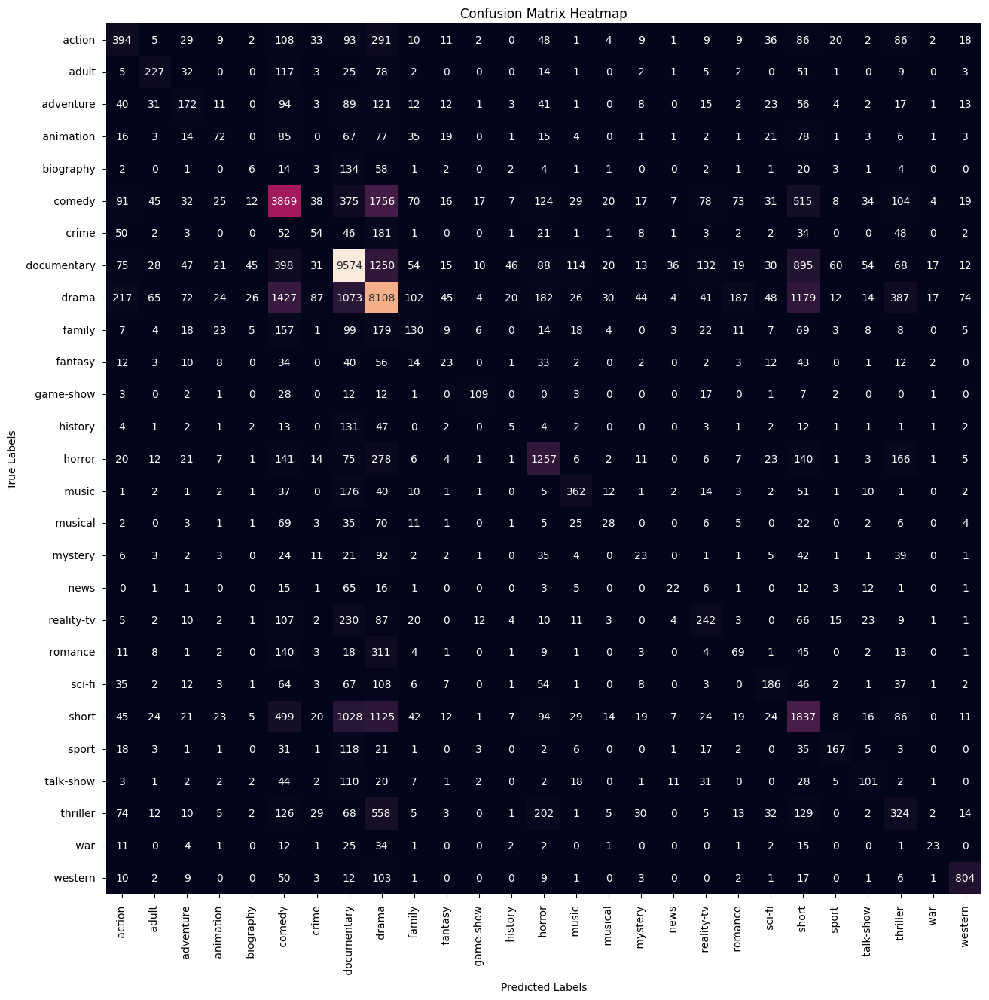

In [27]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### RandomForestClassifier

Random Forest - Train Score: 0.9995941483572233
Random Forest - Test Score: 0.48908812514988836
               precision    recall  f1-score   support

      action        0.01      0.71      0.02        14
       adult        0.04      0.86      0.08        28
   adventure        0.12      0.65      0.20       142
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.27      0.55      0.36      3656
       crime        0.01      1.00      0.02         4
 documentary        0.88      0.56      0.68     20872
       drama        0.85      0.41      0.55     27929
      family        0.02      0.94      0.04        18
     fantasy        0.00      0.00      0.00         1
   game-show        0.42      0.88      0.57        95
     history        0.00      0.00      0.00         1
      horror        0.13      0.73      0.22       394
       music        0.10      0.82      0.18        91
     musical        0.0

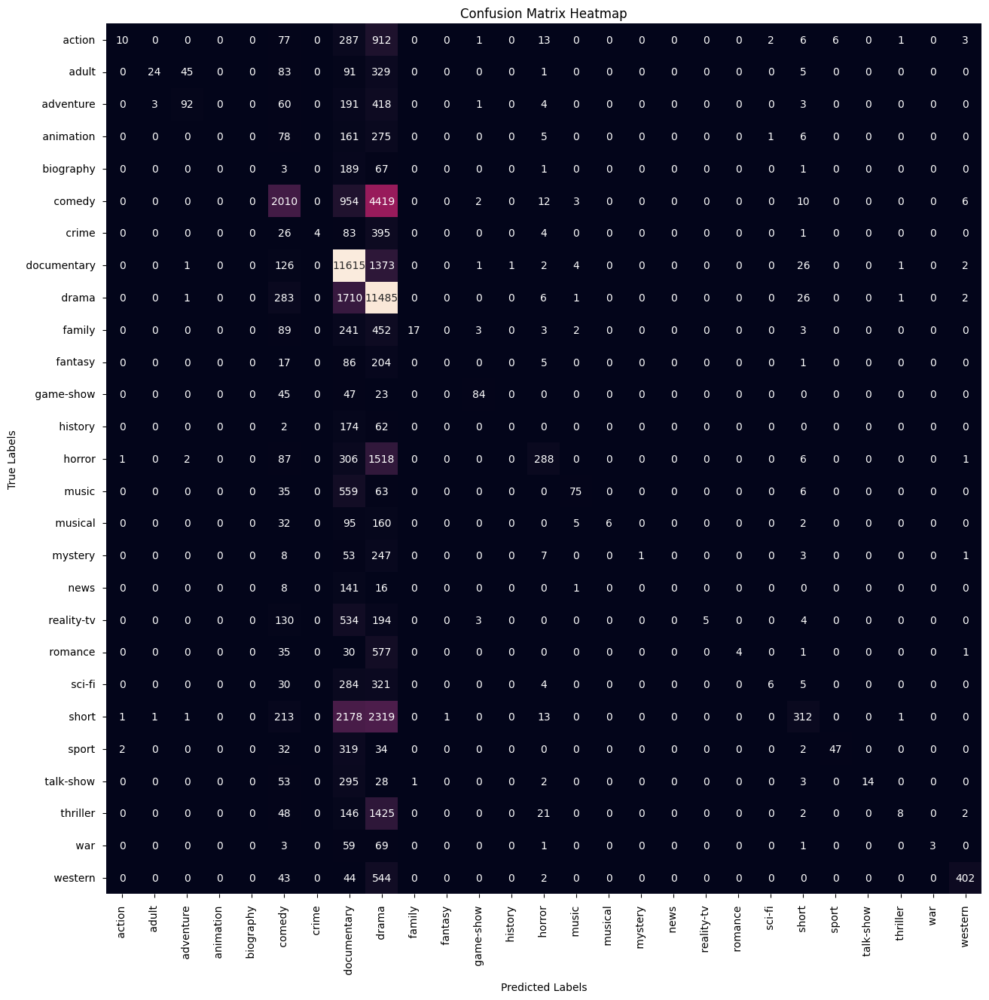

In [28]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

## Now use TfidfVectorizer technique

In [29]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

### MultinomialNB with TfidfVectorizer

Model Score on Training data 0.6417805818436734
Model Score on Training data 0.522829154906193
               precision    recall  f1-score   support

      action        0.03      0.64      0.06        64
       adult        0.02      0.75      0.04        16
   adventure        0.06      0.49      0.10        92
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.44      0.53      0.48      6158
       crime        0.00      0.00      0.00         0
 documentary        0.89      0.57      0.70     20650
       drama        0.84      0.46      0.59     24741
      family        0.00      1.00      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.15      0.97      0.25        30
     history        0.00      0.00      0.00         0
      horror        0.26      0.76      0.39       760
       music        0.04      0.81      0.08        37
     musical        0.00

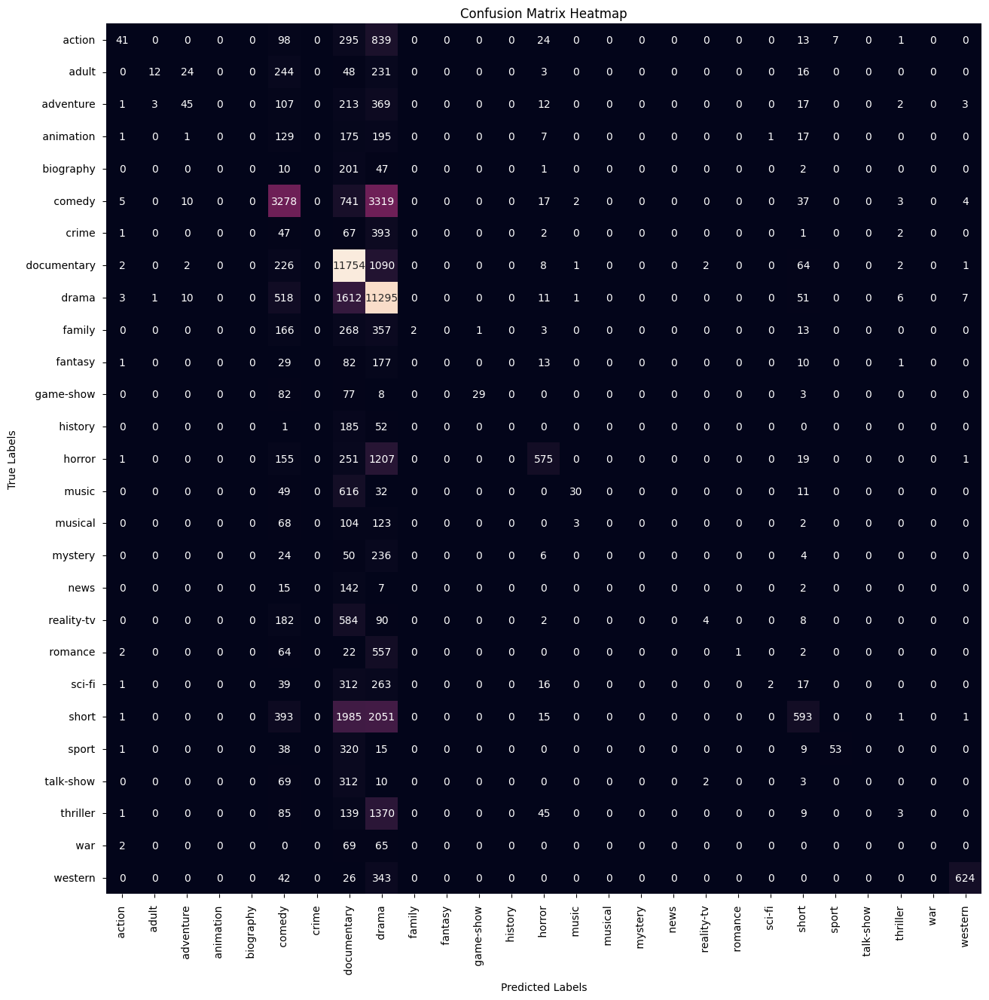

In [30]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### LogisticRegression with TfidfVectorizer

Model Score on Training data 0.9965687088383419
Model Score on Training data 0.5681000608777464
               precision    recall  f1-score   support

      action        0.31      0.41      0.36      1008
       adult        0.40      0.62      0.49       376
   adventure        0.23      0.42      0.30       423
   animation        0.15      0.47      0.23       169
   biography        0.01      0.10      0.02        29
      comedy        0.58      0.53      0.55      8131
       crime        0.09      0.20      0.13       232
 documentary        0.78      0.71      0.74     14467
       drama        0.69      0.56      0.62     16617
      family        0.15      0.34      0.21       364
     fantasy        0.07      0.21      0.10       102
   game-show        0.58      0.76      0.66       152
     history        0.03      0.18      0.04        33
      horror        0.60      0.62      0.61      2143
       music        0.54      0.63      0.58       633
     musical        0.1

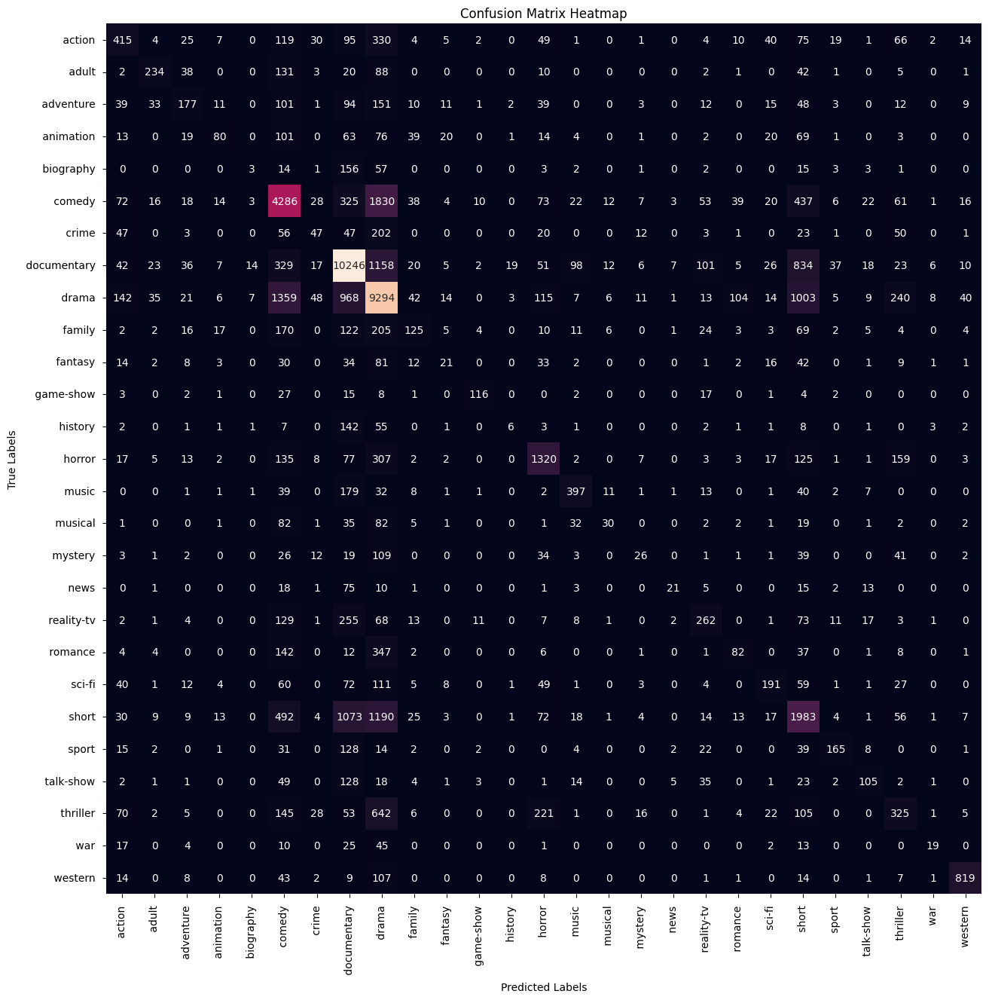

In [31]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC ) with TfidfVectorizer

Model Score on Training data 0.9995941483572233
Model Score on Training data 0.5199328500009224
               precision    recall  f1-score   support

      action        0.30      0.34      0.32      1160
       adult        0.39      0.47      0.43       486
   adventure        0.22      0.32      0.26       531
   animation        0.14      0.29      0.19       247
   biography        0.02      0.05      0.03       112
      comedy        0.52      0.50      0.51      7760
       crime        0.11      0.16      0.13       346
 documentary        0.73      0.69      0.71     13806
       drama        0.60      0.54      0.57     15076
      family        0.16      0.24      0.19       549
     fantasy        0.07      0.12      0.09       186
   game-show        0.55      0.64      0.59       169
     history        0.02      0.05      0.03       103
      horror        0.57      0.55      0.56      2276
       music        0.49      0.54      0.51       673
     musical        0.0

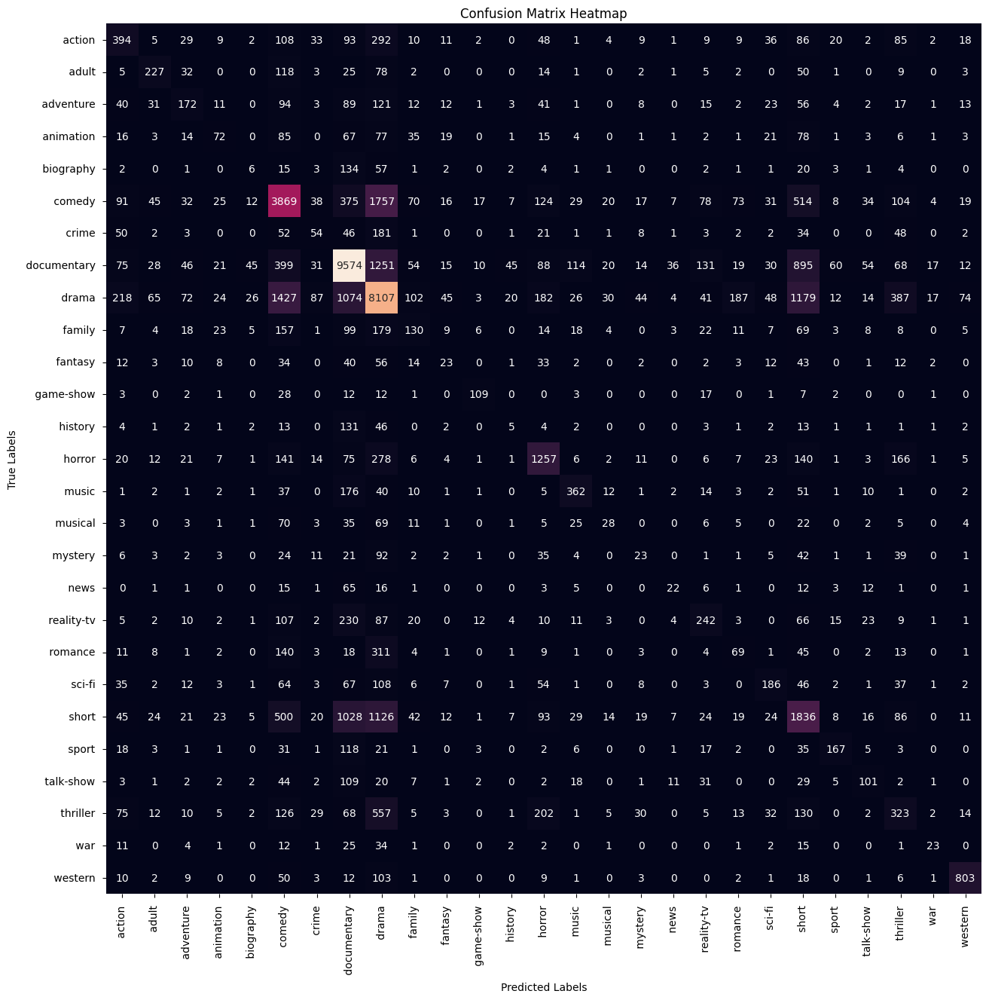

In [32]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### RandomForestClassifier with TfidfVectorizer

Random Forest - Train Score: 0.9995941483572233
Random Forest - Test Score: 0.4865607762835058
               precision    recall  f1-score   support

      action        0.01      0.71      0.02        14
       adult        0.04      0.81      0.07        27
   adventure        0.10      0.61      0.18       130
   animation        0.00      0.50      0.00         2
   biography        0.00      0.00      0.00         0
      comedy        0.26      0.54      0.35      3515
       crime        0.01      1.00      0.02         5
 documentary        0.88      0.56      0.68     20922
       drama        0.85      0.41      0.55     28075
      family        0.02      0.94      0.04        18
     fantasy        0.00      0.00      0.00         1
   game-show        0.36      0.89      0.51        80
     history        0.00      0.00      0.00         1
      horror        0.13      0.71      0.22       417
       music        0.08      0.83      0.15        72
     musical        0.02

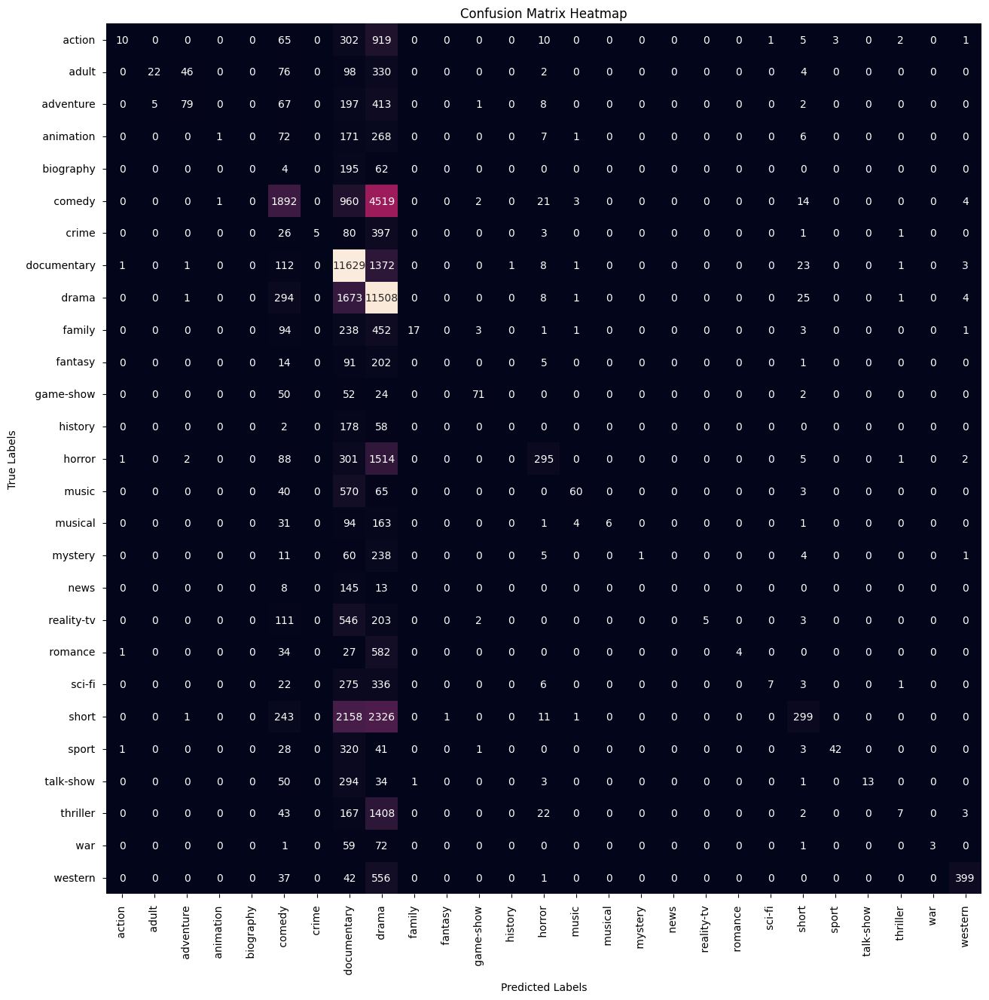

In [33]:
# Create a Random Forest model
random_forest = RandomForestClassifier()


# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)


print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

## Any one have another technique for better Accuracy. Please Comment. 
